<a href="https://colab.research.google.com/github/AlexanderLu98/TDT13/blob/main/TDT12_MIDI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Setup

In [ ]:
!sudo apt install -y fluidsynth

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fluid-soundfont-gm libevdev2 libfluidsynth3 libgudev-1.0-0 libinput-bin
  libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a libqt5dbus5
  libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libxcb-icccm4 libxcb-image0 libxcb-keysyms1
  libxcb-render-util0 libxcb-util1 libxcb-xinerama0 libxcb-xinput0 libxcb-xkb1
  libxkbcommon-x11-0 qsynth qt5-gtk-platformtheme qttranslations5-l10n
  timgm6mb-soundfont
Suggested packages:
  fluid-soundfont-gs qt5-image-formats-plugins qtwayland5 jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libevdev2 libfluidsynth3 libgudev-1.0-0
  libinput-bin libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a
  libqt5dbus5 libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libx

In [ ]:
!pip install --upgrade pyfluidsynth

In [ ]:
!pip install pretty_midi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 15.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.3/50.3 kB 6.3 MB/s eta 0:00:00
  Created wheel for pretty_midi: filename=pretty_midi-0.2.10-py3-none-any.whl size=5592287 sha256=ebd7048e0bf108f6f59b7b9beb6526551dcf549126045d0380514a63a875efa3
  Stored in directory: /root/.cache/pip/wheels/cd/a5/30/7b8b7f58709f5150f67f98fde4b891ebf0be9ef07a8af49f25
Successfully built pretty_midi


In [ ]:
import collections
import datetime
import fluidsynth
import glob
import numpy as np
import pathlib
import pandas as pd
import pretty_midi
import seaborn as sns
import tensorflow as tf

from IPython import display
from matplotlib import pyplot as plt
from typing import Optional

In [ ]:
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)

# Sampling rate for audio playback
_SAMPLING_RATE = 16000

Download Maestro v.3 .0.0 dataset (only midi)

In [ ]:
data_dir = pathlib.Path('data/maestro-v3.0.0')
if not data_dir.exists():
  tf.keras.utils.get_file(
      'maestro-v3.0.0-midi.zip',
      origin='https://storage.googleapis.com/magentadata/datasets/maestro/v3.0.0/maestro-v3.0.0-midi.zip',
      extract=True,
      cache_dir='.', cache_subdir='data',
  )

58416533/58416533 [==============================] - 0s 0us/step


In [ ]:
filenames = glob.glob(str(data_dir/'**/*.mid*'))
print('Number of files:', len(filenames))

Number of files: 1276


Process Midi files

In [ ]:
sample_file_1 = filenames[69]
sample_file_2 = filenames[420]
sample_file_3 = filenames[777]
sample_file_4 = filenames[1000]
sample_file_5 = filenames[10]

In [ ]:
def display_audio(pm: pretty_midi.PrettyMIDI, seconds=30):
  waveform = pm.fluidsynth(fs=_SAMPLING_RATE)
  # Take a sample of the generated waveform to mitigate kernel resets
  waveform_short = waveform[:seconds*_SAMPLING_RATE]
  return display.Audio(waveform_short, rate=_SAMPLING_RATE)

In [ ]:
pm1 = pretty_midi.PrettyMIDI(sample_file_1)
pm2 = pretty_midi.PrettyMIDI(sample_file_2)
pm3 = pretty_midi.PrettyMIDI(sample_file_3)
pm4 = pretty_midi.PrettyMIDI(sample_file_4)
pm5 = pretty_midi.PrettyMIDI(sample_file_5)

In [ ]:
print(sample_file_1)
display_audio(pm1)

data/maestro-v3.0.0/2014/MIDI-UNPROCESSED_11-13_R1_2014_MID--AUDIO_12_R1_2014_wav--2.midi


In [ ]:
print(sample_file_2)
display_audio(pm2)

data/maestro-v3.0.0/2013/ORIG-MIDI_02_7_10_13_Group_MID--AUDIO_12_R3_2013_wav--4.midi


In [ ]:
print(sample_file_3)
display_audio(pm3)

data/maestro-v3.0.0/2008/MIDI-Unprocessed_06_R1_2008_01-04_ORIG_MID--AUDIO_06_R1_2008_wav--4.midi


In [ ]:
print(sample_file_4)
display_audio(pm4)

data/maestro-v3.0.0/2006/MIDI-Unprocessed_24_R1_2006_01-05_ORIG_MID--AUDIO_24_R1_2006_05_Track05_wav.midi


In [ ]:
print(sample_file_5)
display_audio(pm5)

data/maestro-v3.0.0/2014/MIDI-UNPROCESSED_06-08_R1_2014_MID--AUDIO_07_R1_2014_wav--6.midi


In [ ]:
print('Number of instruments:', len(pm1.instruments))
instrument = pm1.instruments[0]
instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
print('Instrument name:', instrument_name)

Number of instruments: 1
Instrument name: Acoustic Grand Piano


In [ ]:
print(instrument.notes)

[Note(start=1.044271, end=1.071615, pitch=69, velocity=76), Note(start=1.045573, end=1.076823, pitch=64, velocity=76), Note(start=1.041667, end=1.079427, pitch=61, velocity=77), Note(start=1.032552, end=1.083333, pitch=73, velocity=89), Note(start=1.169271, end=1.213542, pitch=64, velocity=80), Note(start=1.164062, end=1.217448, pitch=69, velocity=75), Note(start=1.184896, end=1.227865, pitch=61, velocity=73), Note(start=1.164062, end=1.227865, pitch=73, velocity=88), Note(start=1.330729, end=1.359375, pitch=64, velocity=80), Note(start=1.332031, end=1.363281, pitch=69, velocity=74), Note(start=1.326823, end=1.368490, pitch=61, velocity=71), Note(start=1.328125, end=1.369792, pitch=73, velocity=90), Note(start=1.464844, end=1.497396, pitch=64, velocity=81), Note(start=1.462240, end=1.500000, pitch=69, velocity=74), Note(start=1.477865, end=1.507812, pitch=61, velocity=82), Note(start=1.462240, end=1.516927, pitch=73, velocity=86), Note(start=1.614583, end=1.647135, pitch=64, velocity=8

Extract notes

In [ ]:
for i, note in enumerate(instrument.notes[:10]):
  note_name = pretty_midi.note_number_to_name(note.pitch)
  duration = note.end - note.start
  print(f'{i}: pitch={note.pitch}, note_name={note_name},'
        f' duration={duration:.4f}')

0: pitch=69, note_name=A4, duration=0.0273
1: pitch=64, note_name=E4, duration=0.0312
2: pitch=61, note_name=C#4, duration=0.0378
3: pitch=73, note_name=C#5, duration=0.0508
4: pitch=64, note_name=E4, duration=0.0443
5: pitch=69, note_name=A4, duration=0.0534
6: pitch=61, note_name=C#4, duration=0.0430
7: pitch=73, note_name=C#5, duration=0.0638
8: pitch=64, note_name=E4, duration=0.0286
9: pitch=69, note_name=A4, duration=0.0312


In [ ]:
def midi_to_notes(midi_file: str) -> pd.DataFrame:
  pm = pretty_midi.PrettyMIDI(midi_file)
  instrument = pm.instruments[0]
  notes = collections.defaultdict(list)

  # Sort the notes by start time
  sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
  prev_start = sorted_notes[0].start

  for note in sorted_notes:
    start = note.start
    end = note.end
    notes['pitch'].append(note.pitch)
    notes['start'].append(start)
    notes['end'].append(end)
    notes['step'].append(start - prev_start)
    notes['duration'].append(end - start)
    prev_start = start

  return pd.DataFrame({name: np.array(value) for name, value in notes.items()})

In [ ]:
raw_notes = midi_to_notes(sample_file_1)
raw_notes.head()

,pitch,start,end,step,duration
0,73,1.032552,1.083333,0.000000,0.050781
1,61,1.041667,1.079427,0.009115,0.037760
2,69,1.044271,1.071615,0.002604,0.027344
3,64,1.045573,1.076823,0.001302,0.031250
4,69,1.164062,1.217448,0.118490,0.053385


In [ ]:
def plot_piano_roll(notes: pd.DataFrame, count: Optional[int] = None):
  if count:
    title = f'First {count} notes'
  else:
    title = f'Whole track'
    count = len(notes['pitch'])
  plt.figure(figsize=(20, 4))
  plot_pitch = np.stack([notes['pitch'], notes['pitch']], axis=0)
  plot_start_stop = np.stack([notes['start'], notes['end']], axis=0)
  plt.plot(
      plot_start_stop[:, :count], plot_pitch[:, :count], color="b", marker=".")
  plt.xlabel('Time [s]')
  plt.ylabel('Pitch')
  _ = plt.title(title)

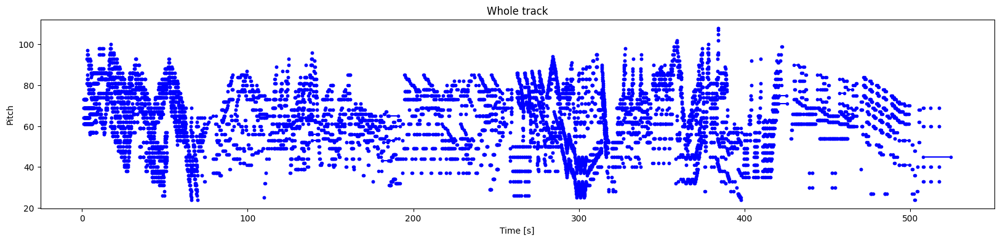

In [ ]:
plot_piano_roll(raw_notes)

In [ ]:
def plot_distributions(notes: pd.DataFrame, drop_percentile=2.5):
  plt.figure(figsize=[15, 5])
  plt.subplot(1, 3, 1)
  sns.histplot(notes, x="pitch", bins=20)

  plt.subplot(1, 3, 2)
  max_step = np.percentile(notes['step'], 100 - drop_percentile)
  sns.histplot(notes, x="step", bins=np.linspace(0, max_step, 21))

  plt.subplot(1, 3, 3)
  max_duration = np.percentile(notes['duration'], 100 - drop_percentile)
  sns.histplot(notes, x="duration", bins=np.linspace(0, max_duration, 21))

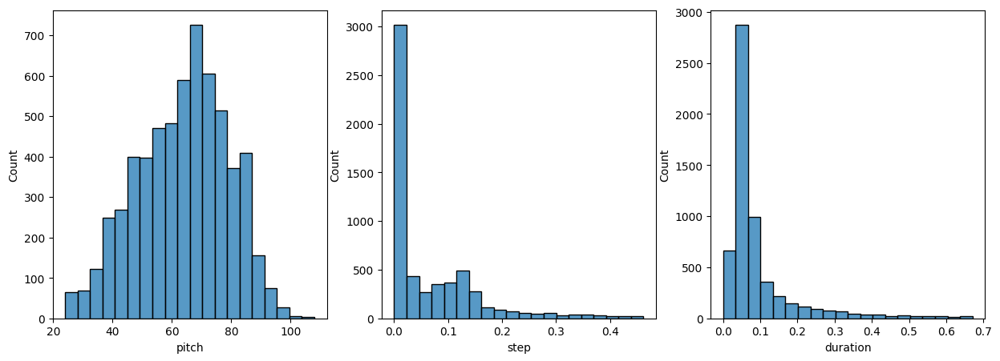

In [ ]:
plot_distributions(raw_notes)

In [ ]:
def notes_to_midi(
  notes: pd.DataFrame,
  out_file: str,
  instrument_name: str,
  velocity: int = 100,  # note loudness
) -> pretty_midi.PrettyMIDI:

  pm = pretty_midi.PrettyMIDI()
  instrument = pretty_midi.Instrument(
      program=pretty_midi.instrument_name_to_program(
          instrument_name))

  prev_start = 0
  for i, note in notes.iterrows():
    start = float(prev_start + note['step'])
    end = float(start + note['duration'])
    note = pretty_midi.Note(
        velocity=velocity,
        pitch=int(note['pitch']),
        start=start,
        end=end,
    )
    instrument.notes.append(note)
    prev_start = start

  pm.instruments.append(instrument)
  pm.write(out_file)
  return pm

In [ ]:
example_file = 'example.midi'
example_pm = notes_to_midi(
    raw_notes, out_file=example_file, instrument_name=instrument_name)

In [ ]:
display_audio(example_pm)

In [ ]:
print(sample_file_1)
display_audio(pm1)

data/maestro-v3.0.0/2014/MIDI-UNPROCESSED_11-13_R1_2014_MID--AUDIO_12_R1_2014_wav--2.midi


Comment, the original is ten times better. Should add back velocity and similar data. Midi is so simple allready so I don't see the problem'


In [ ]:
num_files = 5
all_notes = []
for f in filenames[:num_files]:
  notes = midi_to_notes(f)
  all_notes.append(notes)

all_notes = pd.concat(all_notes)

In [ ]:
n_notes = len(all_notes)
print('Number of notes parsed:', n_notes)

Number of notes parsed: 51536


In [ ]:
key_order = ['pitch', 'step', 'duration']
train_notes = np.stack([all_notes[key] for key in key_order], axis=1)

In [ ]:
notes_ds = tf.data.Dataset.from_tensor_slices(train_notes)
notes_ds.element_spec

TensorSpec(shape=(3,), dtype=tf.float64, name=None)

In [ ]:
def create_sequences(
    dataset: tf.data.Dataset,
    seq_length: int,
    vocab_size = 128,
) -> tf.data.Dataset:
  """Returns TF Dataset of sequence and label examples."""
  seq_length = seq_length+1

  # Take 1 extra for the labels
  windows = dataset.window(seq_length, shift=1, stride=1,
                              drop_remainder=True)

  # `flat_map` flattens the" dataset of datasets" into a dataset of tensors
  flatten = lambda x: x.batch(seq_length, drop_remainder=True)
  sequences = windows.flat_map(flatten)

  # Normalize note pitch
  def scale_pitch(x):
    x = x/[vocab_size,1.0,1.0]
    return x

  # Split the labels
  def split_labels(sequences):
    inputs = sequences[:-1]
    labels_dense = sequences[-1]
    labels = {key:labels_dense[i] for i,key in enumerate(key_order)}

    return scale_pitch(inputs), labels

  return sequences.map(split_labels, num_parallel_calls=tf.data.AUTOTUNE)

In [ ]:
seq_length = 25
vocab_size = 128
seq_ds = create_sequences(notes_ds, seq_length, vocab_size)
seq_ds.element_spec

(TensorSpec(shape=(25, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(), dtype=tf.float64, name=None)})

In [ ]:
for seq, target in seq_ds.take(1):
  print('sequence shape:', seq.shape)
  print('sequence elements (first 10):', seq[0: 10])
  print()
  print('target:', target)

sequence shape: (25, 3)
sequence elements (first 10): tf.Tensor(
[[0.515625   0.         1.890625  ]
 [0.421875   0.0078125  0.48567708]
 [0.5234375  1.67317708 0.87890625]
 [0.4296875  0.03255208 1.06901042]
 [0.515625   1.80598958 0.35677083]
 [0.421875   0.02083333 0.37239583]
 [0.515625   0.6875     0.0625    ]
 [0.421875   0.01822917 0.06510417]
 [0.515625   0.17447917 1.59765625]
 [0.421875   0.02994792 1.62239583]], shape=(10, 3), dtype=float64)

target: {'pitch': <tf.Tensor: shape=(), dtype=float64, numpy=50.0>, 'step': <tf.Tensor: shape=(), dtype=float64, numpy=0.0>, 'duration': <tf.Tensor: shape=(), dtype=float64, numpy=0.3294270833333339>}


In [ ]:
batch_size = 64
buffer_size = n_notes - seq_length  # the number of items in the dataset
train_ds = (seq_ds
            .shuffle(buffer_size)
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

In [ ]:
train_ds.element_spec

(TensorSpec(shape=(64, 25, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(64,), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(64,), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(64,), dtype=tf.float64, name=None)})

Create and train the model

In [ ]:
def mse_with_positive_pressure(y_true: tf.Tensor, y_pred: tf.Tensor):
  mse = (y_true - y_pred) ** 2
  positive_pressure = 10 * tf.maximum(-y_pred, 0.0)
  return tf.reduce_mean(mse + positive_pressure)

In [ ]:
input_shape = (seq_length, 3)
learning_rate = 0.005

inputs = tf.keras.Input(input_shape)
x = tf.keras.layers.LSTM(128)(inputs)

outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

model = tf.keras.Model(inputs, outputs)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

model.compile(loss=loss, optimizer=optimizer)

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 25, 3)]              0         []                            
                                                                                                  
 lstm (LSTM)                 (None, 128)                  67584     ['input_1[0][0]']             
                                                                                                  
 duration (Dense)            (None, 1)                    129       ['lstm[0][0]']                
                                                                                                  
 pitch (Dense)               (None, 128)                  16512     ['lstm[0][0]']                
                                                                                              

In [ ]:
losses = model.evaluate(train_ds, return_dict=True)
losses

804/804 [==============================] - 17s 4ms/step - loss: 5.8027 - duration_loss: 0.2264 - pitch_loss: 4.8562 - step_loss: 0.7201


{'loss': 5.802664756774902,
 'duration_loss': 0.226415753364563,
 'pitch_loss': 4.856162071228027,
 'step_loss': 0.7200860381126404}

In [ ]:
model.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 1.0,
        'duration':1.0,
    },
    optimizer=optimizer,
)

In [ ]:
model.evaluate(train_ds, return_dict=True)

804/804 [==============================] - 3s 3ms/step - loss: 1.1893 - duration_loss: 0.2264 - pitch_loss: 4.8562 - step_loss: 0.7201


{'loss': 1.1893106698989868,
 'duration_loss': 0.226415753364563,
 'pitch_loss': 4.856162071228027,
 'step_loss': 0.7200860381126404}

In [ ]:
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath='./training_checkpoints/ckpt_{epoch}',
        save_weights_only=True),
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=5,
        verbose=1,
        restore_best_weights=True),
]

In [ ]:
%%time
epochs = 50

history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
)

Epoch 1/50
804/804 [==============================] - 9s 6ms/step - loss: 0.3966 - duration_loss: 0.1248 - pitch_loss: 4.1124 - step_loss: 0.0662
Epoch 2/50
804/804 [==============================] - 4s 5ms/step - loss: 0.3818 - duration_loss: 0.1174 - pitch_loss: 4.0198 - step_loss: 0.0635
Epoch 3/50
804/804 [==============================] - 5s 6ms/step - loss: 0.3743 - duration_loss: 0.1130 - pitch_loss: 3.9693 - step_loss: 0.0628
Epoch 4/50
804/804 [==============================] - 4s 5ms/step - loss: 0.3697 - duration_loss: 0.1109 - pitch_loss: 3.9342 - step_loss: 0.0621
Epoch 5/50
804/804 [==============================] - 4s 5ms/step - loss: 0.3669 - duration_loss: 0.1096 - pitch_loss: 3.9248 - step_loss: 0.0611
Epoch 6/50
804/804 [==============================] - 5s 6ms/step - loss: 0.3675 - duration_loss: 0.1111 - pitch_loss: 3.9172 - step_loss: 0.0605
Epoch 7/50
804/804 [==============================] - 4s 6ms/step - loss: 0.3628 - duration_loss: 0.1071 - pitch_loss: 3.910

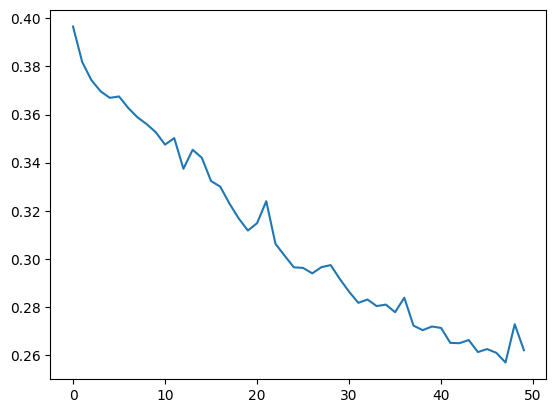

In [ ]:
plt.plot(history.epoch, history.history['loss'], label='total loss')
plt.show()

Generate notes

In [ ]:
def predict_next_note(
    notes: np.ndarray,
    model: tf.keras.Model,
    temperature: float = 1.0) -> tuple[int, float, float]:
  """Generates a note as a tuple of (pitch, step, duration), using a trained sequence model."""

  assert temperature > 0

  # Add batch dimension
  inputs = tf.expand_dims(notes, 0)

  predictions = model.predict(inputs)
  pitch_logits = predictions['pitch']
  step = predictions['step']
  duration = predictions['duration']

  pitch_logits /= temperature
  pitch = tf.random.categorical(pitch_logits, num_samples=1)
  pitch = tf.squeeze(pitch, axis=-1)
  duration = tf.squeeze(duration, axis=-1)
  step = tf.squeeze(step, axis=-1)

  # `step` and `duration` values should be non-negative
  step = tf.maximum(0, step)
  duration = tf.maximum(0, duration)

  return int(pitch), float(step), float(duration)

In [ ]:
temperature = 2.0
num_predictions = 460

sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)

# The initial sequence of notes; pitch is normalized similar to training
# sequences
input_notes = (
    sample_notes[:seq_length] / np.array([vocab_size, 1, 1]))

generated_notes = []
prev_start = 0
for _ in range(num_predictions):
  pitch, step, duration = predict_next_note(input_notes, model, temperature)
  start = prev_start + step
  end = start + duration
  input_note = (pitch, step, duration)
  generated_notes.append((*input_note, start, end))
  input_notes = np.delete(input_notes, 0, axis=0)
  input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
  prev_start = start

generated_notes = pd.DataFrame(
    generated_notes, columns=(*key_order, 'start', 'end'))

1/1 [==============================] - 0s 18ms/step


In [ ]:
generated_notes.head(10)

,pitch,step,duration,start,end
0,65,0.039741,0.089563,0.039741,0.129304
1,80,0.391424,0.000000,0.431165,0.431165
2,80,0.478305,0.000000,0.909470,0.909470
3,84,0.488718,0.000000,1.398188,1.398188
4,89,0.490626,0.000000,1.888814,1.888814
5,76,0.489430,0.000000,2.378244,2.378244
6,86,0.483102,0.000000,2.861346,2.861346
7,90,0.477795,0.000000,3.339140,3.339140
8,92,0.478178,0.000000,3.817318,3.817318
9,84,0.473361,0.000000,4.290680,4.290680


In [ ]:
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

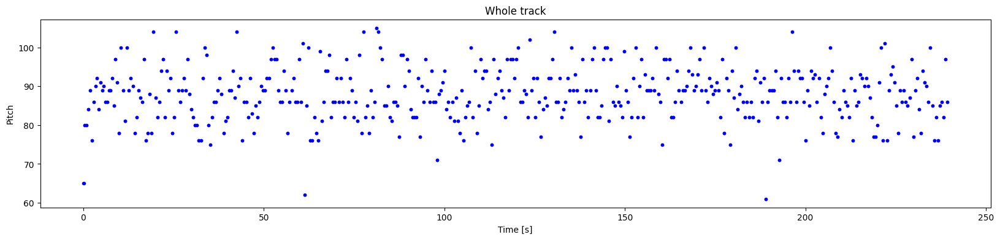

In [ ]:
plot_piano_roll(generated_notes)

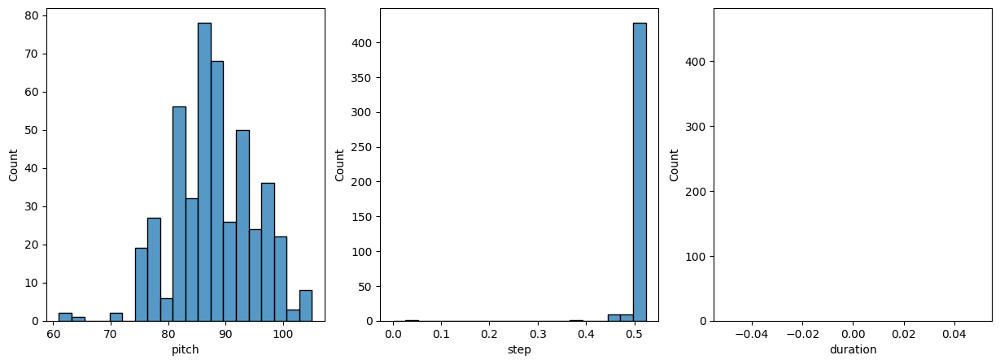

In [ ]:
plot_distributions(generated_notes)

**GAN**

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

# Define the dimensions of the random noise input
noise_dim = 100  # You can adjust this as needed

# Generator model
def build_generator():
    model = tf.keras.Sequential()
    model.add(layers.Input(shape=(noise_dim,)))
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Reshape((16, 16, 1)))
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', activation='relu'))
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', activation='relu'))
    model.add(layers.Conv2DTranspose(1, (4, 4), strides=(2, 2), padding='same', activation='sigmoid'))
    return model

# Discriminator model
def build_discriminator():
    discriminator_input = tf.keras.layers.Input(shape=(128, 128, 1))  # Define the input shape
    model = tf.keras.Sequential()
    model.add(discriminator_input)  # Use the input layer with the adjusted shape
    model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', activation='relu'))
    model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', activation='relu'))
    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))
    return model


# Instantiate the generator and discriminator
generator = build_generator()
discriminator = build_discriminator()


In [ ]:

# Define the GAN model
def build_gan(generator, discriminator):
    discriminator.trainable = False  # Freeze the discriminator during GAN training

    gan_input = tf.keras.layers.Input(shape=(noise_dim,))
    generated_data = generator(gan_input)

    gan_output = discriminator(generated_data)

    gan = tf.keras.models.Model(gan_input, gan_output)

    return gan


gan = build_gan(generator, discriminator)


In [ ]:
# Loss functions for GAN
def gan_loss(y_true, y_pred):
    return tf.keras.losses.binary_crossentropy(y_true, y_pred)

# Compile the models
generator.compile(loss=gan_loss, optimizer='adam')
discriminator.compile(loss=gan_loss, optimizer='adam')
gan.compile(loss=gan_loss, optimizer='adam')

In [ ]:
import pretty_midi
import numpy as np
import cv2

# Define the number of GAN training epochs and batch size
gan_epochs = 50

for epoch in range(gan_epochs):
    for _ in range(buffer_size // batch_size):
        # Generate random noise as input for the generator
        noise = np.random.randn(batch_size, noise_dim)

        # Generate MIDI sequences using the generator
        generated_midi = generator.predict(noise)

        # Preprocess and reshape real MIDI data for the discriminator
        for real_batch in train_ds:
            real_midi, real_labels = real_batch  # Input sequences and labels
            real_midi = real_midi.numpy()  # Convert to a NumPy array
            real_midi_gray = []

            for midi in real_midi:
                # Convert MIDI to a grayscale image
                image = np.zeros((128, 128), dtype=np.uint8)
                min_pitch = 21  # The lowest note on a piano
                max_pitch = 108  # The highest note on a piano

                for note in midi:
                    pitch = note[0]  # Assuming the pitch is in the first element
                    start = int(note[1] * 128)  # Assuming the start time is in the second element
                    end = int(note[2] * 128)  # Assuming the end time is in the third element
                    # Map pitch to a grayscale value between 0 and 255
                    grayscale_value = int(255 * (pitch - min_pitch) / (max_pitch - min_pitch))
                    # Fill the corresponding region of the image with the grayscale value
                    image[start:end, :] = grayscale_value

                # Resize the image to (128, 128)
                resized_image = cv2.resize(image, (128, 128))
                real_midi_gray.append(resized_image)

            real_midi_gray = np.array(real_midi_gray).reshape(-1, 128, 128, 1)

            real_labels = np.ones((real_midi_gray.shape[0], 1))  # Create labels with the correct shape

            # Define fake labels as zeros
            fake_labels = np.zeros((batch_size, 1))

            d_loss_real = discriminator.train_on_batch(real_midi_gray, real_labels)
            d_loss_fake = discriminator.train_on_batch(generated_midi, fake_labels)

        # Train the generator while keeping the discriminator frozen
        noise = np.random.randn(batch_size, noise_dim)
        valid_labels = np.ones((batch_size, 1))

        g_loss = gan.train_on_batch(noise, valid_labels)

        # Monitor the losses
        print(f"Epoch {epoch + 1}, Batch {_ + 1}/{buffer_size // batch_size}")
        print(f"D Loss Real: {d_loss_real}, D Loss Fake: {d_loss_fake}, G Loss: {g_loss}")


2/2 [==============================] - 7s 15ms/step
Epoch 1, Batch 1/804
D Loss Real: 3.2585134506225586, D Loss Fake: 0.6784183979034424, G Loss: 0.7080881595611572
2/2 [==============================] - 0s 6ms/step
Epoch 1, Batch 2/804
D Loss Real: 3.2585134506225586, D Loss Fake: 0.6786571741104126, G Loss: 0.7078522443771362
2/2 [==============================] - 0s 9ms/step
Epoch 1, Batch 3/804
D Loss Real: 3.2585134506225586, D Loss Fake: 0.678943932056427, G Loss: 0.7075551152229309
2/2 [==============================] - 0s 10ms/step
Epoch 1, Batch 4/804
D Loss Real: 3.2585134506225586, D Loss Fake: 0.6792837381362915, G Loss: 0.7072011232376099
2/2 [==============================] - 0s 9ms/step
Epoch 1, Batch 5/804
D Loss Real: 3.2585134506225586, D Loss Fake: 0.6796898245811462, G Loss: 0.7067886590957642
2/2 [==============================] - 0s 12ms/step
Epoch 1, Batch 6/804
D Loss Real: 3.2585134506225586, D Loss Fake: 0.6801341772079468, G Loss: 0.7063733339309692
2/2 [===